<a href="https://colab.research.google.com/github/pablomesa08/Weather-classification_ml/blob/main/models_ml.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TRABAJO MODELOS ML - WEATHER CLASSIFICATION DATA

## Brayan Estrada Ramos - Dennis Patrick Juilland Prada - Pablo Mesa Hernández - Alejandro Pérez Morales - 2024

# Importaciones Iniciales

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# Cargando Datos

In [4]:
weather_df = pd.read_csv('/content/weather_classification_data.csv')

In [5]:
weather_df.head(10)

,Temperature,Humidity,Wind Speed,Precipitation (%),Cloud Cover,Atmospheric Pressure,UV Index,Season,Visibility (km),Location,Weather Type
0,14.0,73,9.5,82.0,partly cloudy,1010.82,2,Winter,3.5,inland,Rainy
1,39.0,96,8.5,71.0,partly cloudy,1011.43,7,Spring,10.0,inland,Cloudy
2,30.0,64,7.0,16.0,clear,1018.72,5,Spring,5.5,mountain,Sunny
3,38.0,83,1.5,82.0,clear,1026.25,7,Spring,1.0,coastal,Sunny
4,27.0,74,17.0,66.0,overcast,990.67,1,Winter,2.5,mountain,Rainy
5,32.0,55,3.5,26.0,overcast,1010.03,2,Summer,5.0,inland,Cloudy
6,-2.0,97,8.0,86.0,overcast,990.87,1,Winter,4.0,inland,Snowy
7,3.0,85,6.0,96.0,partly cloudy,984.46,1,Winter,3.5,inland,Snowy
8,3.0,83,6.0,66.0,overcast,999.44,0,Winter,1.0,mountain,Snowy
9,28.0,74,8.5,107.0,clear,1012.13,8,Winter,7.5,coastal,Sunny


# Análisis de los datos

## Distribución de los casos según la clase y análisis de nulidad

In [6]:
weather_df["Weather Type"].value_counts()

,count
Weather Type,
Rainy,3300
Cloudy,3300
Sunny,3300
Snowy,3300


In [7]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13200 entries, 0 to 13199
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Temperature           13200 non-null  float64
 1   Humidity              13200 non-null  int64  
 2   Wind Speed            13200 non-null  float64
 3   Precipitation (%)     13200 non-null  float64
 4   Cloud Cover           13200 non-null  object 
 5   Atmospheric Pressure  13200 non-null  float64
 6   UV Index              13200 non-null  int64  
 7   Season                13200 non-null  object 
 8   Visibility (km)       13200 non-null  float64
 9   Location              13200 non-null  object 
 10  Weather Type          13200 non-null  object 
dtypes: float64(5), int64(2), object(4)
memory usage: 1.1+ MB


Se observa que las variables en el dataset no presentan datos nulos. Se tienen 7 variables de tipo numérico y 4 categóricas.

In [8]:
weather_df["Weather Type"].unique()

array(['Rainy', 'Cloudy', 'Sunny', 'Snowy'], dtype=object)

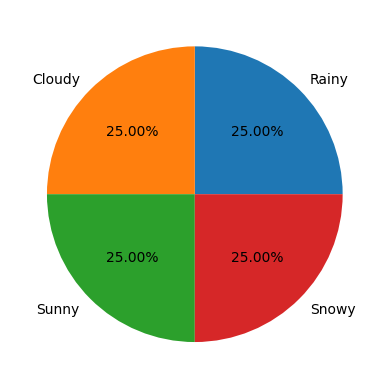

In [9]:
plt.pie(weather_df['Weather Type'].value_counts(),
        labels = weather_df['Weather Type'].unique(), autopct='%.2f%%');

Se determina que las clases de la variable objetivo (Weather Type) se encuentran distribuidas de manera uniforme.

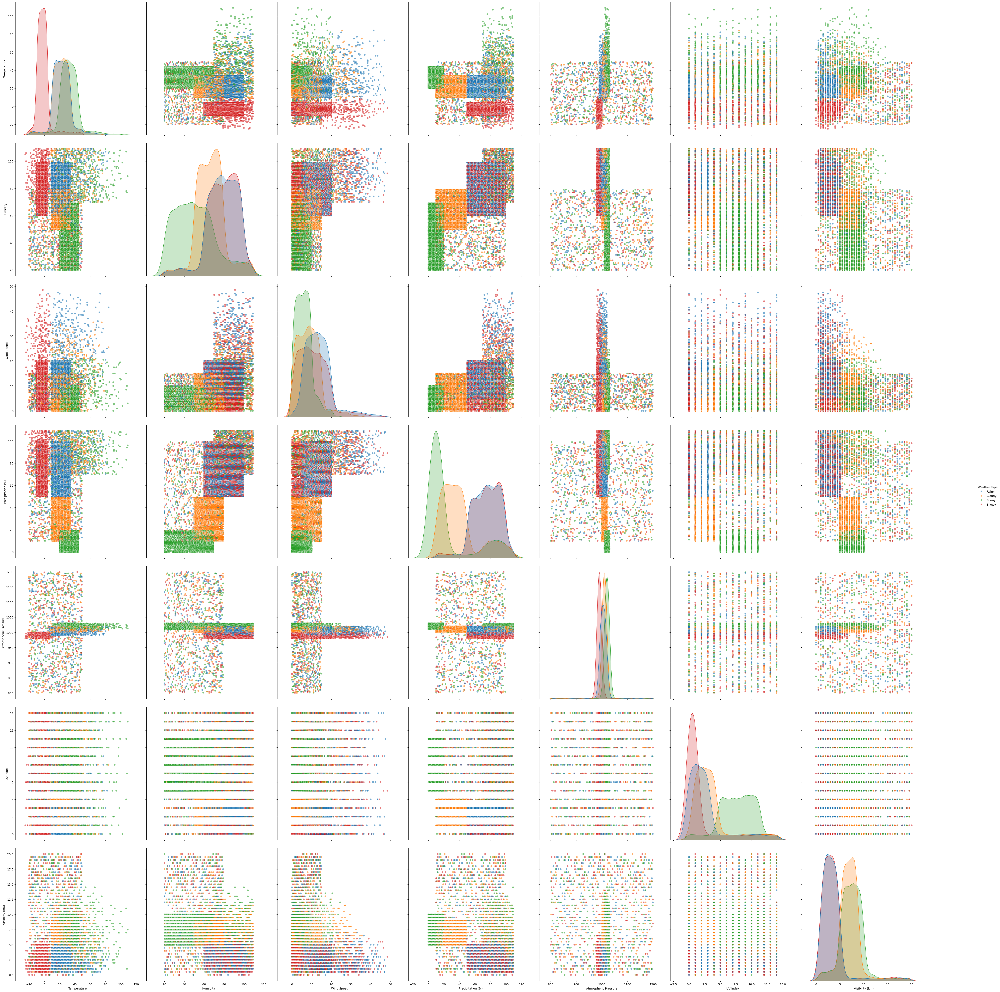

In [10]:
g = sns.pairplot(weather_df, hue='Weather Type', plot_kws={'alpha':0.6})
g.fig.set_size_inches(50,50)

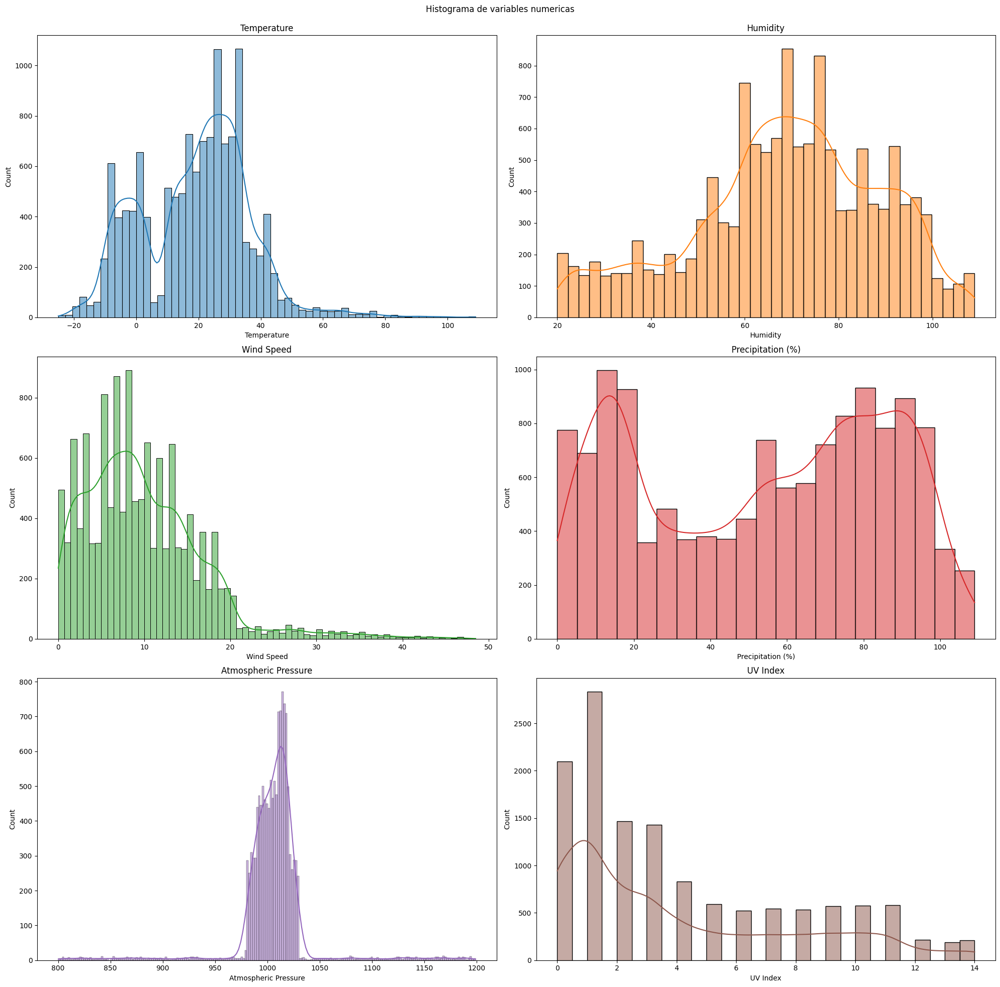

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(3, 2, figsize=(20,20))
ax = ax.flat
num_col = weather_df.select_dtypes(include=['float64', 'int64']).columns
for i, col in enumerate(num_col):
    if i < len(ax):  # Verificar si el índice está dentro del rango
        sns.histplot(data=weather_df, kde=True, x=col, color=(list(plt.rcParams['axes.prop_cycle'])*7)[i]['color'], ax=ax[i])
        ax[i].set_title(col)

fig.tight_layout()
fig.subplots_adjust(top=0.95)
fig.suptitle('Histograma de variables numericas')
plt.show()

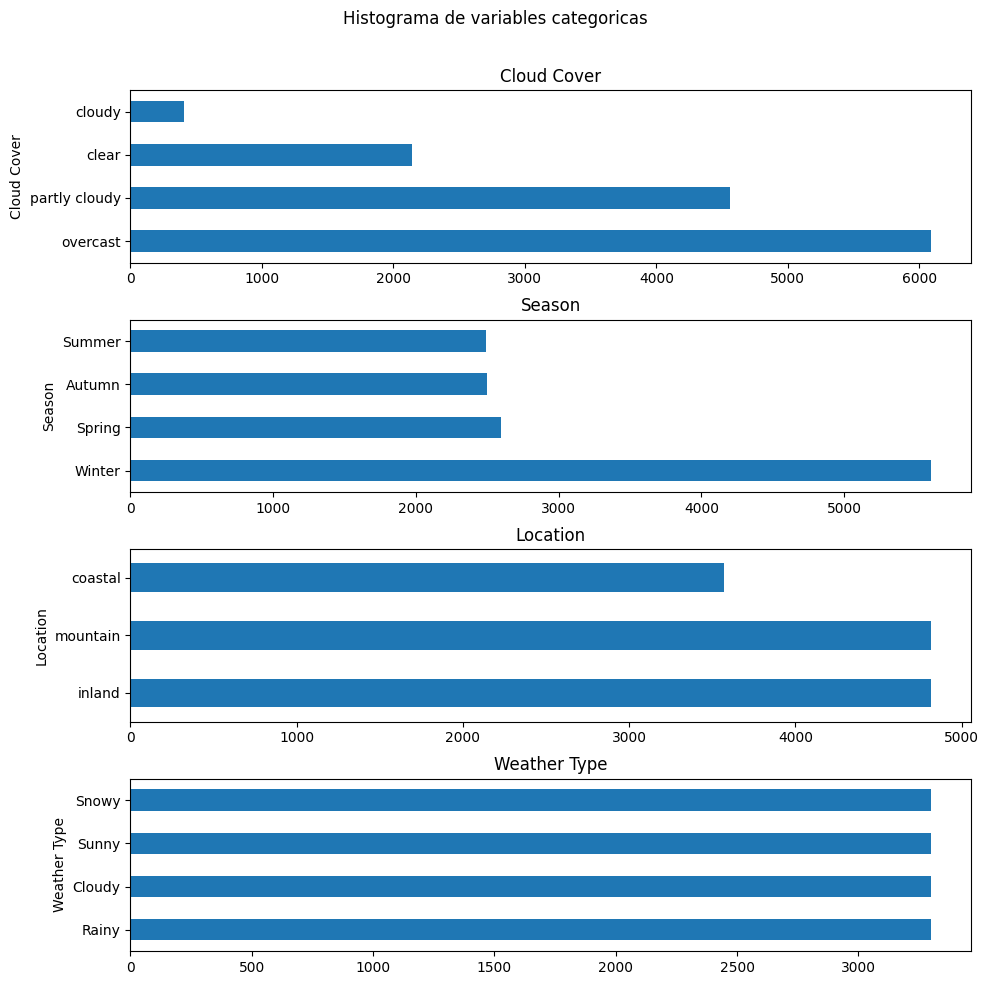

In [12]:
# Estadistica univariada
# Histograma de frecuencia de variables categoricas
fig, ax = plt.subplots(4, 1, figsize=(10,10))
ax = ax.flat
cat_data= weather_df.select_dtypes(include=['object']).columns
for i, col in enumerate(cat_data):
    weather_df[col].value_counts().plot.barh(ax=ax[i])
    ax[i].set_title(col)

fig.tight_layout()
fig.subplots_adjust(top=0.90)
fig.suptitle('Histograma de variables categoricas')
plt.show()

# Análisis de correlación

In [13]:
!pip install phik
!pip install networkx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 12.2 MB/s eta 0:00:00


In [14]:
import phik
from phik import resources
from phik.binning import bin_data
from phik.decorators import *
from phik.report import plot_correlation_matrix
import networkx as nx

interval columns not set, guessing: ['Temperature', 'Humidity', 'Wind Speed', 'Precipitation (%)', 'Atmospheric Pressure', 'UV Index', 'Visibility (km)']


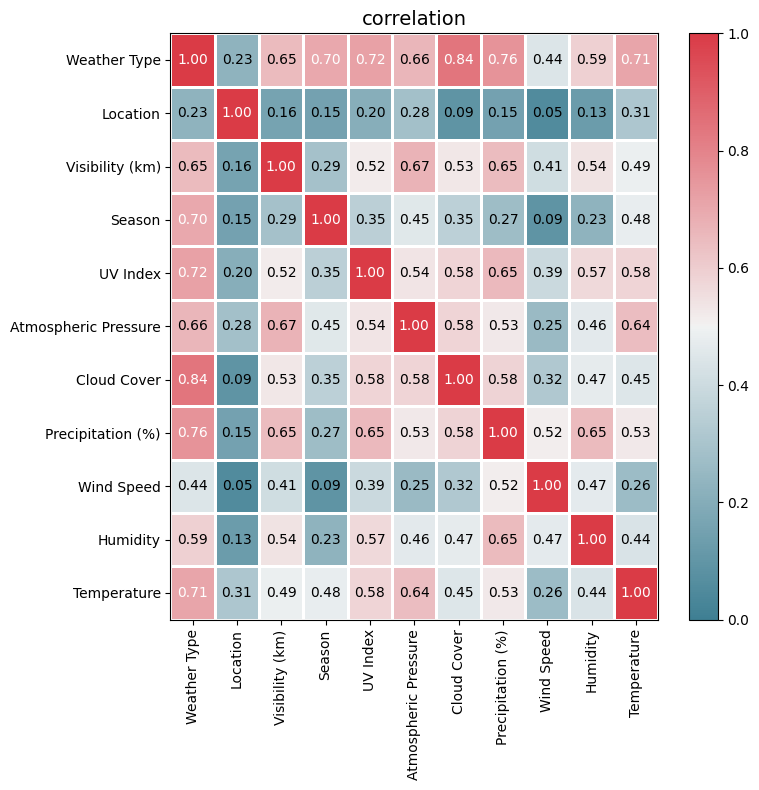

In [15]:
coerr_mat = weather_df.phik_matrix()
cmap = sns.diverging_palette(220, 10, as_cmap=True)

plot_correlation_matrix(coerr_mat.values, x_labels=coerr_mat.columns, y_labels=coerr_mat.index,
                        vmin=0, vmax=1, color_map=cmap, figsize=(8, 8));

Se pueden ver cuatro tipos de correlación: Nula, Débil, Moderada y Fuerte, pero analizando el mapa de correlación se logra determinar respecto a la variable objetivo (Weather Type) una correlación fuerte (de 0.7 a 1) en los siguientes casos:

- Weather Type y Season con una correlación de 0.70 (directa).

- Weather Type y UV Index con una correlación de 0.72 (directa).

- Weather Type y Cloud Cover con una correlación de 0.84 (directa).

- Weather Type y Precipitation (%) con una correlación de 0.76 (directa).

- Weather Type y Temperature con una correlación de 0.71 (directa).

In [16]:
class GraphVisualization:
  def __init__(self,nameClass='Weather Type', width=10, height=10):
    self.visual = []
    self.nameClass=nameClass
    self.width=width
    self.height=height

  def addEdge(self, a, b):
    temp = [a, b]
    self.visual.append(temp)

  def visualize(self):
    plt.figure(figsize=(self.width, self.height))
    G = nx.Graph()
    G.add_edges_from(self.visual)
    for i in list(G.nodes()):
        G.nodes[i]['corr_target'] = coerr_mat[self.nameClass][i]
    node_color = [20 * nx.get_node_attributes(G, 'corr_target')[v] for v in G]
    nx.draw_shell(G, node_size=2750, node_color = node_color, alpha = 0.7, with_labels = True, edge_color ='0', cmap = cmap, font_size=9)
    plt.show()

In [17]:
G = GraphVisualization(width=5,height=5)
for col1 in weather_df.columns:
  for col2 in weather_df.columns:
    if col1 != col2 and col1 != 'class' and col2 != 'class':
      if coerr_mat[col1][col2] >= 0.7:
        G.addEdge(col1,col2)

Por medio de este grafo evidenciamos dichas correlaciones fuertes con Weather Type.

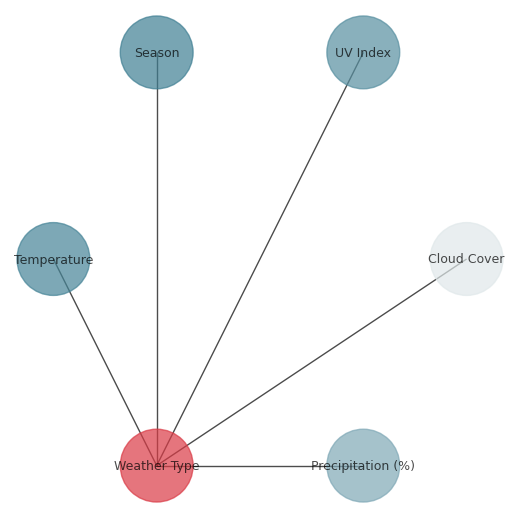

In [18]:
G.visualize()

# Encoding

## OneHot Encoder - Variables categóricas

## Label Encoder - Variable Objetivo

In [19]:
from sklearn import preprocessing

In [20]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13200 entries, 0 to 13199
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Temperature           13200 non-null  float64
 1   Humidity              13200 non-null  int64  
 2   Wind Speed            13200 non-null  float64
 3   Precipitation (%)     13200 non-null  float64
 4   Cloud Cover           13200 non-null  object 
 5   Atmospheric Pressure  13200 non-null  float64
 6   UV Index              13200 non-null  int64  
 7   Season                13200 non-null  object 
 8   Visibility (km)       13200 non-null  float64
 9   Location              13200 non-null  object 
 10  Weather Type          13200 non-null  object 
dtypes: float64(5), int64(2), object(4)
memory usage: 1.1+ MB


Existen 3 variables categóricas que deben ser transformadas a numéricas. Se utilizará un One Hot Encoder.

La variable de clasificación "Weather Type" va a ser codificada usando un Label Encoder.

In [21]:
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder


# --- Preprocesamiento de datos ---

# 1. Definir columnas categóricas y numéricas
cat_cols = ['Cloud Cover', 'Season', 'Location']
num_cols = ['Temperature', 'Humidity', 'Wind Speed', 'Precipitation (%)',
            'Atmospheric Pressure', 'UV Index', 'Visibility (km)']

# 2. Crear transformadores
# 2.1. OneHotEncoder para variables categóricas
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# 2.2. 'passthrough' para variables numéricas
numerical_transformer = 'passthrough'

# 3. Combinar transformadores usando ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, num_cols),
        ('cat', categorical_transformer, cat_cols)
    ])

# Ajustar y transformar los datos
X = preprocessor.fit_transform(weather_df.iloc[:, :-1])

# Codificar la variable objetivo 'Y'
label_encoder = LabelEncoder()
Y = label_encoder.fit_transform(weather_df.iloc[:, -1])  # Codificar 'Y'

# --- Mostrar resultados ---
print("\nMatriz de características (X):\n")
print(X)  # Imprime la matriz dispersa
#print(X.toarray()) #Imprime la matriz densa

print("\nVariable objetivo (Y):\n")
print(Y)


Matriz de características (X):

[[14.  73.   9.5 ...  0.   1.   0. ]
 [39.  96.   8.5 ...  0.   1.   0. ]
 [30.  64.   7.  ...  0.   0.   1. ]
 ...
 [30.  77.   5.5 ...  1.   0.   0. ]
 [ 3.  76.  10.  ...  0.   1.   0. ]
 [-5.  38.   0.  ...  0.   0.   1. ]]

Variable objetivo (Y):

[1 0 3 ... 0 2 1]


In [22]:
# Obtener los nombres de las columnas después de la transformación
nombres_columnas = preprocessor.get_feature_names_out()
print(nombres_columnas)

['num__Temperature' 'num__Humidity' 'num__Wind Speed'
 'num__Precipitation (%)' 'num__Atmospheric Pressure' 'num__UV Index'
 'num__Visibility (km)' 'cat__Cloud Cover_clear' 'cat__Cloud Cover_cloudy'
 'cat__Cloud Cover_overcast' 'cat__Cloud Cover_partly cloudy'
 'cat__Season_Autumn' 'cat__Season_Spring' 'cat__Season_Summer'
 'cat__Season_Winter' 'cat__Location_coastal' 'cat__Location_inland'
 'cat__Location_mountain']


# División de datos en entrenamiento, prueba y validación

Escogeremos un 5% de los datos para validación, del resto un 85% para entrenamiento (con validación cruzada) y un 15% para prueba

In [23]:
from sklearn.model_selection import train_test_split # Me permite dividir los datos

In [24]:
# Para validación
X_train, X_val, y_train, y_val= train_test_split(X, Y, test_size=0.05, random_state=5,stratify=Y) # Entrada, Salida, Porciento, Semilla, Garantizar que porciento sea el mismo de cada clase

# Para prueba
X_train, X_test, y_train, y_test= train_test_split(X_train, y_train, test_size=0.15, random_state=5,stratify=y_train) # Entrada, Salida, Porciento, Semilla, Garantizar que porciento sea el mismo de cada clase

In [25]:
print(np.unique(Y,return_counts=True))
print(np.unique(y_train,return_counts=True)) # Entrenamiento
print(np.unique(y_test,return_counts=True)) # Prueba
print(np.unique(y_val,return_counts=True)) # Validación

(array([0, 1, 2, 3]), array([3300, 3300, 3300, 3300]))
(array([0, 1, 2, 3]), array([2665, 2665, 2665, 2664]))
(array([0, 1, 2, 3]), array([470, 470, 470, 471]))
(array([0, 1, 2, 3]), array([165, 165, 165, 165]))


In [26]:
classes=np.unique(Y)
classes

array([0, 1, 2, 3])

# Modelo kNN

In [27]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc,ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV, StratifiedKFold

En reporte de clasificación:

- Accuracy: proporción de predicciones correctas sobre el total de predicciones realizadas.

- Recall: proporción de verdaderos positivos sobre el total de ejemplos que realmente son positivos.

-
Precision: proporción de verdaderos positivos sobre el total de predicciones positivas realizadas por el modelo

Training Accuracy: 0.92
Testing Accuracy: 0.90
Confusion Matrix:
 [[402  39  11  18]
 [ 29 430   7   4]
 [  9  10 442   9]
 [ 25  21  13 412]]


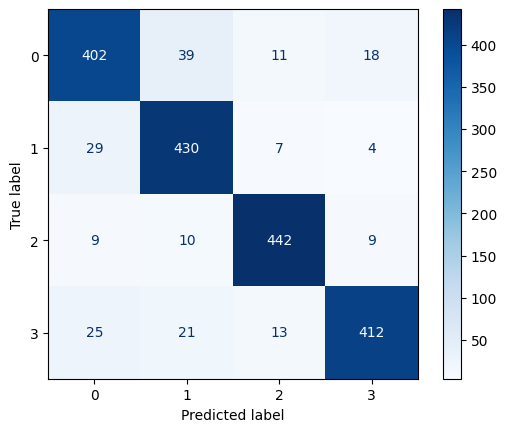

Classification Report para datos de prueba:
               precision    recall  f1-score   support

           0       0.86      0.86      0.86       470
           1       0.86      0.91      0.89       470
           2       0.93      0.94      0.94       470
           3       0.93      0.87      0.90       471

    accuracy                           0.90      1881
   macro avg       0.90      0.90      0.90      1881
weighted avg       0.90      0.90      0.90      1881

Classification Report para datos originales:
               precision    recall  f1-score   support

           0       0.89      0.90      0.89      3300
           1       0.88      0.93      0.91      3300
           2       0.95      0.95      0.95      3300
           3       0.95      0.90      0.92      3300

    accuracy                           0.92     13200
   macro avg       0.92      0.92      0.92     13200
weighted avg       0.92      0.92      0.92     13200

Best Score: 0.8894, Best Params: {'n_ne

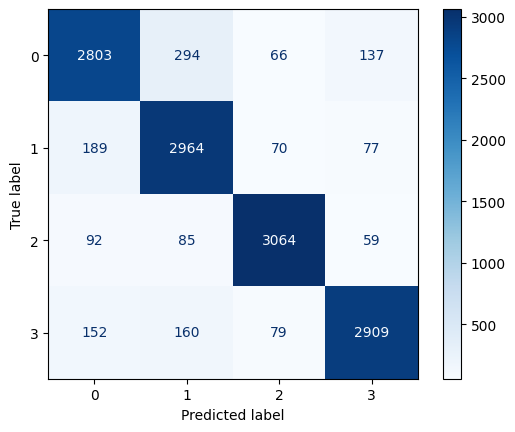

In [28]:

def knn_pipeline(X, Y):

    # Crear el modelo de KNN
    knn = KNeighborsClassifier(n_neighbors=5, metric='euclidean')
    knn.fit(X_train, y_train)

    # Evaluación del modelo
    train_accuracy = knn.score(X_train, y_train)
    test_accuracy = knn.score(X_test, y_test)
    print(f'Training Accuracy: {train_accuracy:.2f}')
    print(f'Testing Accuracy: {test_accuracy:.2f}')

    # Matriz de confusión
    y_pred = knn.predict(X_test) # Predicción para datos de prueba
    cm = confusion_matrix(y_test, y_pred) #Para matriz de confusión contrastando entrenamiento y predicción
    print("Confusion Matrix:\n", cm)
    pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

    # Reporte de clasificación
    print("Classification Report para datos de prueba:\n", classification_report(y_test, y_pred))

    # Predicción para datos originales
    y_train_pred = knn.predict(X)
    print("Classification Report para datos originales:\n", classification_report(Y, y_train_pred))

    # Buscar los mejores hiperparámetros con Grid Search
    param_grid = {'n_neighbors': np.arange(1, 50)}
    knn_grid =KNeighborsClassifier()
    knn_cv = GridSearchCV(knn_grid, param_grid, cv=10) #cv: cross validation
    knn_cv.fit(X_train, y_train)
    print(f'Best Score: {knn_cv.best_score_:.4f}, Best Params: {knn_cv.best_params_}')

    # Validación cruzada usando KFold
    strtfdKFold = StratifiedKFold(n_splits=10)
    kfold = strtfdKFold.split(X, Y)
    scores = []
    predicted_y=np.array([])
    real_y=np.array([])
    print("BEST PARAM: ", knn_cv.best_params_['n_neighbors'])
    for train_index, test_index in strtfdKFold.split(X, Y):
        knn = KNeighborsClassifier(n_neighbors=knn_cv.best_params_['n_neighbors'])  # Usar los mejores hiperparámetros
        X_train_cv, X_test_cv = X[train_index], X[test_index]
        y_train_cv, y_test_cv = Y[train_index], Y[test_index]

        knn.fit(X_train_cv, y_train_cv)
        scores.append(knn.score(X_test_cv, y_test_cv))

        py = knn.predict(X_test_cv)
        predicted_y = np.append(predicted_y, py)
        real_y = np.append(real_y, y_test_cv)

    accuracy = np.mean(scores) * 100
    print(f"Accuracy del modelo utilizando validación cruzada por KFold: {accuracy:.2f}%")


    # Matriz de confusion con hiperparametros
    classes_hp=np.unique(Y)
    cnf_matrix = confusion_matrix(real_y, predicted_y)
    disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=classes_hp)
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

# Llamada a la función con los datos
knn_pipeline(X, Y)


# Modelo de Decision Tree

Training Accuracy: 1.00
Testing Accuracy: 0.91
Confusion Matrix:
 [[409  27  14  20]
 [ 23 425   8  14]
 [  3  12 445  10]
 [ 12  13  10 436]]


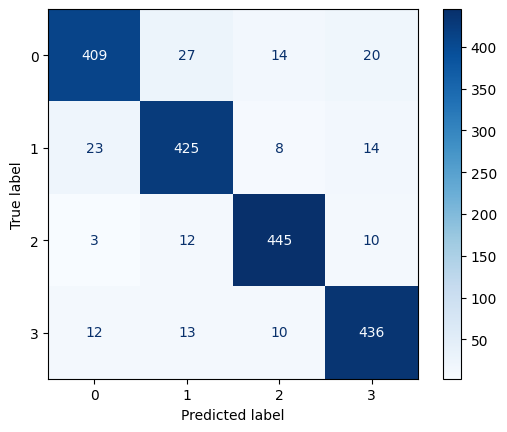

Classification Report para datos de prueba:
               precision    recall  f1-score   support

           0       0.91      0.87      0.89       470
           1       0.89      0.90      0.90       470
           2       0.93      0.95      0.94       470
           3       0.91      0.93      0.92       471

    accuracy                           0.91      1881
   macro avg       0.91      0.91      0.91      1881
weighted avg       0.91      0.91      0.91      1881

Classification Report para datos originales:
               precision    recall  f1-score   support

           0       0.98      0.97      0.98      3300
           1       0.98      0.98      0.98      3300
           2       0.98      0.99      0.99      3300
           3       0.98      0.98      0.98      3300

    accuracy                           0.98     13200
   macro avg       0.98      0.98      0.98     13200
weighted avg       0.98      0.98      0.98     13200



/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best Score: 0.9105, Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': None, 'min_samples_split': 4}
Profundidad del árbol: 10
Número de hojas del árbol: 226


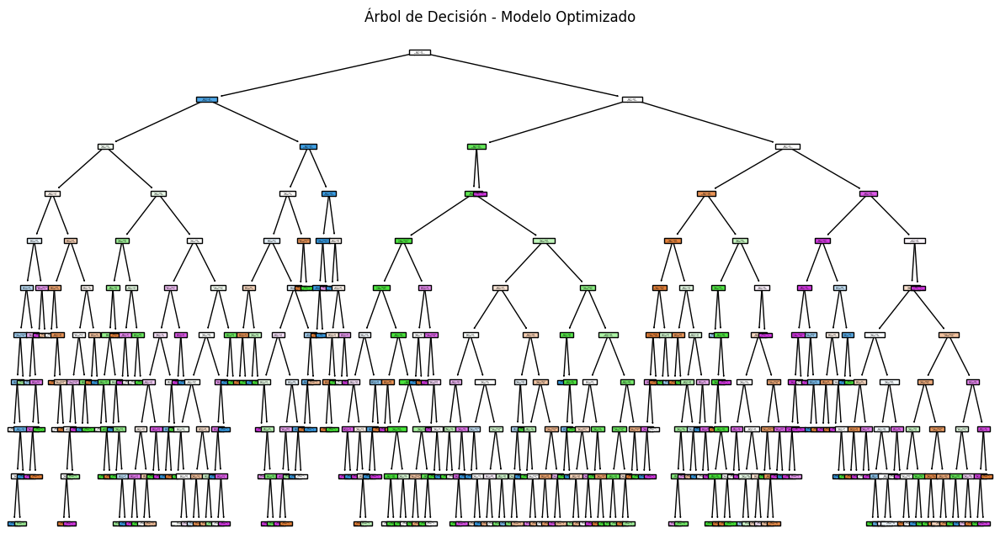

BEST PARAM:  {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': None, 'min_samples_split': 4}
Accuracy del modelo utilizando validación cruzada por KFold: 91.24%


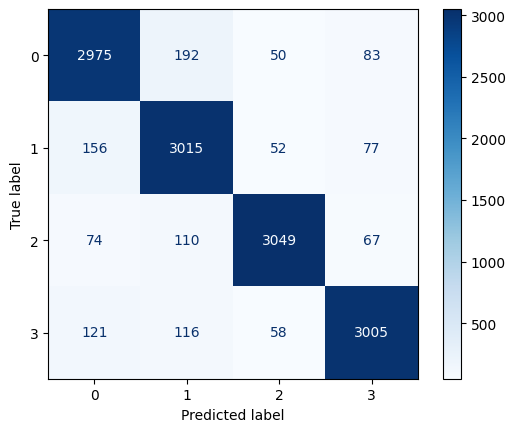

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

def decision_tree_pipeline(X, Y):

    # Crear el modelo de Decision Tree
    decision_tree = DecisionTreeClassifier()
    decision_tree.fit(X_train, y_train)

    # Evaluación del modelo
    train_accuracy = decision_tree.score(X_train, y_train)
    test_accuracy = decision_tree.score(X_test, y_test)
    print(f'Training Accuracy: {train_accuracy:.2f}')
    print(f'Testing Accuracy: {test_accuracy:.2f}')

    # Matriz de confusión para datos de prueba
    y_pred = decision_tree.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:\n", cm)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(Y))
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

    # Reporte de clasificación para datos de prueba
    print("Classification Report para datos de prueba:\n", classification_report(y_test, y_pred))

    # Predicción para datos originales
    y_train_pred = decision_tree.predict(X)
    print("Classification Report para datos originales:\n", classification_report(Y, y_train_pred))

    # Buscar los mejores hiperparámetros con Grid Search
    param_grid = {
        'criterion': ['log_loss', 'gini', 'entropy'],
        'max_depth': [5, 10, 15, 20],
        'max_leaf_nodes': [None, 10, 12, 15],
        'min_samples_split': [2, 3, 4, 5]
    }
    decision_tree_grid = DecisionTreeClassifier()
    dt_cv = GridSearchCV(decision_tree_grid, param_grid, cv=5)
    dt_cv.fit(X_train, y_train)
    print(f'Best Score: {dt_cv.best_score_:.4f}, Best Params: {dt_cv.best_params_}')

     # Visualizar el árbol de decisión
    print(f'Profundidad del árbol: {dt_cv.best_estimator_.get_depth()}')
    print(f'Número de hojas del árbol: {dt_cv.best_estimator_.get_n_leaves()}')
    fig, ax = plt.subplots(figsize=(15, 8))
    plot_tree(dt_cv.best_estimator_, filled=True, ax=ax)
    plt.title("Árbol de Decisión - Modelo Optimizado")
    plt.show()

    # Validación cruzada usando KFold
    strtfdKFold = StratifiedKFold(n_splits=10)
    kfold = strtfdKFold.split(X, Y)
    scores = []
    predicted_y = np.array([])
    real_y = np.array([])
    print("BEST PARAM: ", dt_cv.best_params_)
    for train_index, test_index in strtfdKFold.split(X, Y):
        decision_tree = DecisionTreeClassifier(**dt_cv.best_params_)
        X_train_cv, X_test_cv = X[train_index], X[test_index]
        y_train_cv, y_test_cv = Y[train_index], Y[test_index]

        decision_tree.fit(X_train_cv, y_train_cv)
        scores.append(decision_tree.score(X_test_cv, y_test_cv))

        py = decision_tree.predict(X_test_cv)
        predicted_y = np.append(predicted_y, py)
        real_y = np.append(real_y, y_test_cv)

    accuracy = np.mean(scores) * 100
    print(f"Accuracy del modelo utilizando validación cruzada por KFold: {accuracy:.2f}%")

    # Matriz de confusión con hiperparámetros
    cnf_matrix = confusion_matrix(real_y, predicted_y)
    disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=np.unique(Y))
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

# Llamada a la función con los datos
decision_tree_pipeline(X, Y)


# Modelo de Naive Bayes

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV, StratifiedKFold
import joblib

Training Accuracy: 0.79
Testing Accuracy: 0.79
Confusion Matrix:
 [[362  74  30   4]
 [ 37 361  69   3]
 [ 22   8 438   2]
 [126  22   5 318]]


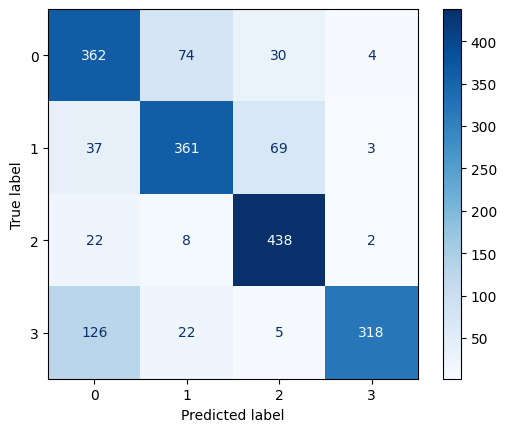

Classification Report para datos de prueba:
               precision    recall  f1-score   support

           0       0.66      0.77      0.71       470
           1       0.78      0.77      0.77       470
           2       0.81      0.93      0.87       470
           3       0.97      0.68      0.80       471

    accuracy                           0.79      1881
   macro avg       0.80      0.79      0.79      1881
weighted avg       0.80      0.79      0.79      1881

Classification Report para datos originales:
               precision    recall  f1-score   support

           0       0.66      0.79      0.72      3300
           1       0.79      0.77      0.78      3300
           2       0.80      0.92      0.86      3300
           3       0.96      0.67      0.79      3300

    accuracy                           0.79     13200
   macro avg       0.80      0.79      0.79     13200
weighted avg       0.80      0.79      0.79     13200



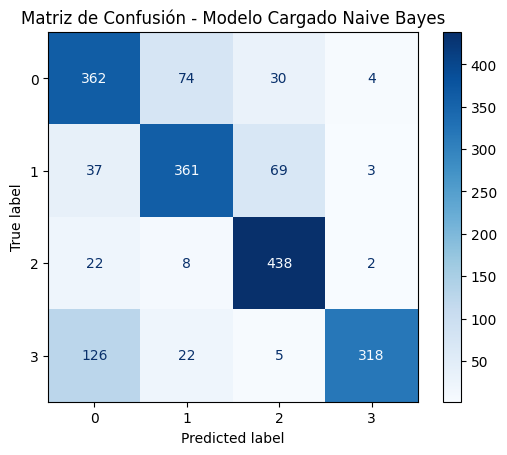

Best Score: 0.8603, Best Params: {'var_smoothing': 0.0006579332246575676}
Usando el mejor parámetro encontrado: {'var_smoothing': 0.0006579332246575676}
Accuracy del modelo utilizando validación cruzada por KFold: 86.09%


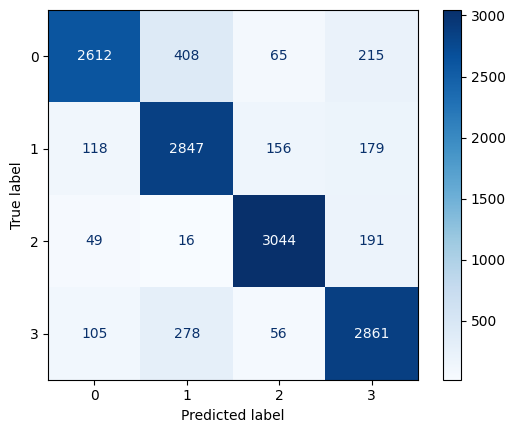

In [31]:
def naive_bayes_pipeline(X, Y):

    # Crear el modelo de Naive Bayes
    bn = GaussianNB()
    bn.fit(X_train, y_train)

    # Evaluación del modelo
    train_accuracy = bn.score(X_train, y_train)
    test_accuracy = bn.score(X_test, y_test)
    print(f'Training Accuracy: {train_accuracy:.2f}')
    print(f'Testing Accuracy: {test_accuracy:.2f}')

    # Matriz de confusión para datos de prueba
    y_pred = bn.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:\n", cm)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(Y))
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

    # Reporte de clasificación para datos de prueba
    print("Classification Report para datos de prueba:\n", classification_report(y_test, y_pred))

    # Predicción para datos originales
    y_train_pred = bn.predict(X)
    print("Classification Report para datos originales:\n", classification_report(Y, y_train_pred))

    # Guardar y cargar el modelo entrenado
    joblib.dump(bn, 'bn.pkl')
    bn_trained = joblib.load('bn.pkl')

    # Validación del modelo cargado - Matriz de Confusión
    y_pred_loaded = bn_trained.predict(X_test)
    cm_loaded = confusion_matrix(y_test, y_pred_loaded)
    disp_loaded = ConfusionMatrixDisplay(confusion_matrix=cm_loaded, display_labels=np.unique(Y))
    disp_loaded.plot(cmap=plt.cm.Blues)
    plt.title('Matriz de Confusión - Modelo Cargado Naive Bayes')
    plt.show()

    # Búsqueda de hiperparámetros con Grid Search (var_smoothing)
    param_grid = {'var_smoothing': np.logspace(0, -9, num=100)}
    bn_grid = GridSearchCV(GaussianNB(), param_grid, cv=5, n_jobs=-1)
    bn_grid.fit(X_train, y_train)

    print(f'Best Score: {bn_grid.best_score_:.4f}, Best Params: {bn_grid.best_params_}')

    # Validación cruzada usando KFold con los mejores hiperparámetros
    strtfdKFold = StratifiedKFold(n_splits=10)
    kfold = strtfdKFold.split(X, Y)
    scores = []
    predicted_y = np.array([])
    real_y = np.array([])

    print(f'Usando el mejor parámetro encontrado: {bn_grid.best_params_}')

    for train_index, test_index in strtfdKFold.split(X, Y):
        bn_cv = GaussianNB(var_smoothing=bn_grid.best_params_['var_smoothing'])
        X_train_cv, X_test_cv = X[train_index], X[test_index]
        y_train_cv, y_test_cv = Y[train_index], Y[test_index]

        bn_cv.fit(X_train_cv, y_train_cv)
        scores.append(bn_cv.score(X_test_cv, y_test_cv))

        py = bn_cv.predict(X_test_cv)
        predicted_y = np.append(predicted_y, py)
        real_y = np.append(real_y, y_test_cv)

    accuracy = np.mean(scores) * 100
    print(f"Accuracy del modelo utilizando validación cruzada por KFold: {accuracy:.2f}%")

    # Matriz de confusión con validación cruzada
    cnf_matrix = confusion_matrix(real_y, predicted_y)
    disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=np.unique(Y))
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

# Llamada a la función con los datos
naive_bayes_pipeline(X, Y)


# Modelo de Support Vector Machine (SVM)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Función para graficar la función de decisión del modelo SVM
def plot_svc_decision_function(model, X, y, ax=None, plot_support=True):
    """Función para graficar la función de decisión del SVC."""
    if ax is None:
        ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    # Crear malla para evaluar el modelo
    x = np.linspace(xlim[0], xlim[1], 30)
    y = np.linspace(ylim[0], ylim[1], 30)
    Y, X = np.meshgrid(y, x)
    xy = np.vstack([X.ravel(), Y.ravel()]).T
    P = model.decision_function(xy).reshape(X.shape)

    # Graficar la frontera de decisión y los márgenes
    ax.contour(X, Y, P, colors='k', levels=[-1, 0, 1], alpha=0.5, linestyles=['--', '-', '--'])

    # Graficar los vectores de soporte
    if plot_support:
        ax.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1], s=300, linewidth=1, facecolors='none')
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

Training Accuracy (SVC Lineal): 0.88
Testing Accuracy (SVC Lineal): 0.89
Confusion Matrix (SVC Lineal):
 [[391  47  14  18]
 [ 24 411  24  11]
 [ 14   4 443   9]
 [ 18   7  15 431]]


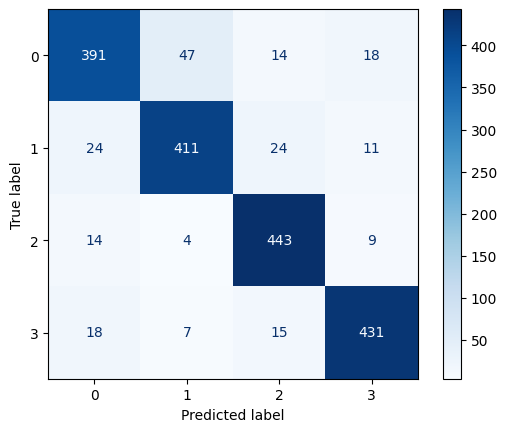

Classification Report (SVC Lineal):
               precision    recall  f1-score   support

           0       0.87      0.83      0.85       470
           1       0.88      0.87      0.88       470
           2       0.89      0.94      0.92       470
           3       0.92      0.92      0.92       471

    accuracy                           0.89      1881
   macro avg       0.89      0.89      0.89      1881
weighted avg       0.89      0.89      0.89      1881

Classification Report para datos originales (SVC Lineal):
               precision    recall  f1-score   support

           0       0.87      0.84      0.85      3300
           1       0.87      0.86      0.86      3300
           2       0.89      0.93      0.91      3300
           3       0.91      0.90      0.90      3300

    accuracy                           0.88     13200
   macro avg       0.88      0.88      0.88     13200
weighted avg       0.88      0.88      0.88     13200

Best Score: 0.8874, Best Params: {

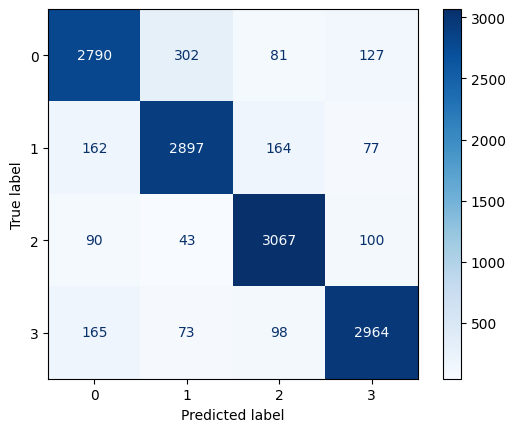

In [ ]:


def svm_pipeline(X, Y):

    # Crear el modelo base de SVM (lineal)
    svc_linear = SVC(kernel='linear', probability=True)

    # Entrenamiento del modelo base
    svc_linear.fit(X_train, y_train)

    # Evaluación del modelo
    train_accuracy_linear = svc_linear.score(X_train, y_train)
    test_accuracy_linear = svc_linear.score(X_test, y_test)
    print(f'Training Accuracy (SVC Lineal): {train_accuracy_linear:.2f}')
    print(f'Testing Accuracy (SVC Lineal): {test_accuracy_linear:.2f}')

    # Matriz de confusión para el modelo lineal
    y_pred_linear = svc_linear.predict(X_test)
    cm_linear = confusion_matrix(y_test, y_pred_linear)
    print("Confusion Matrix (SVC Lineal):\n", cm_linear)
    disp_linear = ConfusionMatrixDisplay(confusion_matrix=cm_linear, display_labels=np.unique(Y))
    disp_linear.plot(cmap=plt.cm.Blues)
    plt.show()

    # Reporte de clasificación para el modelo lineal
    print("Classification Report (SVC Lineal):\n", classification_report(y_test, y_pred_linear))

    # Predicción para datos originales
    y_train_pred_linear = svc_linear.predict(X)
    print("Classification Report para datos originales (SVC Lineal):\n", classification_report(Y, y_train_pred_linear))

    # Buscar los mejores hiperparámetros con RandomizedSearchCV (más rápido que GridSearchCV)
    param_grid = {
        'C': [0.1, 1, 10],  # Reducir el número de valores de C
        'kernel': ['linear']  # Sólo probar el kernel lineal
    }
    svc_grid = SVC(probability=True)
    svc_cv = GridSearchCV(svc_grid, param_grid, cv=3, n_jobs=-1)  # Reducir a 3 folds para más rapidez
    svc_cv.fit(X_train, y_train)

    print(f'Best Score: {svc_cv.best_score_:.4f}, Best Params: {svc_cv.best_params_}')

    # Validación cruzada usando KFold con los mejores hiperparámetros
    strtfdKFold = StratifiedKFold(n_splits=3)  # Reducir a 3 splits
    scores_linear = []
    predicted_y_linear = np.array([])
    real_y_linear = np.array([])

    print(f'Usando los mejores hiperparámetros: {svc_cv.best_params_}')

    for train_index, test_index in strtfdKFold.split(X, Y):
        svc_linear_cv = SVC(**svc_cv.best_params_, probability=True)
        X_train_cv, X_test_cv = X[train_index], X[test_index]
        y_train_cv, y_test_cv = Y[train_index], Y[test_index]

        svc_linear_cv.fit(X_train_cv, y_train_cv)
        scores_linear.append(svc_linear_cv.score(X_test_cv, y_test_cv))

        py_linear = svc_linear_cv.predict(X_test_cv)
        predicted_y_linear = np.append(predicted_y_linear, py_linear)
        real_y_linear = np.append(real_y_linear, y_test_cv)

    accuracy_linear = np.mean(scores_linear) * 100
    print(f"Accuracy del modelo lineal utilizando validación cruzada por KFold: {accuracy_linear:.2f}%")

    # Matriz de confusión con validación cruzada (modelo con los mejores hiperparámetros)
    cnf_matrix_linear = confusion_matrix(real_y_linear, predicted_y_linear)
    disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix_linear, display_labels=np.unique(Y))
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

# Llamada a la función con los datos
svm_pipeline(X, Y)


# Modelo de Multi Layer Perceptron (MLP)

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
Training Accuracy: 0.42
Testing Accuracy: 0.41
Confusion Matrix:
 [[218 100   0 152]
 [187 272   0  11]
 [ 69 297   0 104]
 [120  64   0 287]]


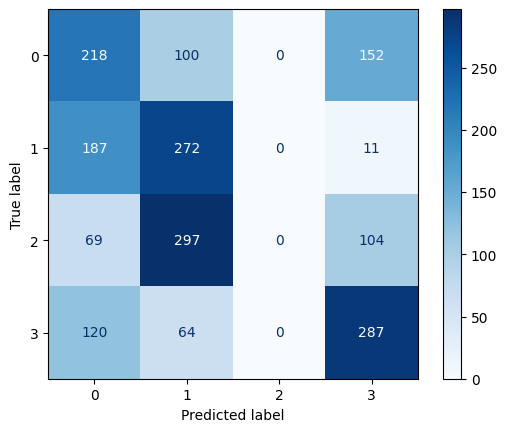

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/shared-libs/python3.9

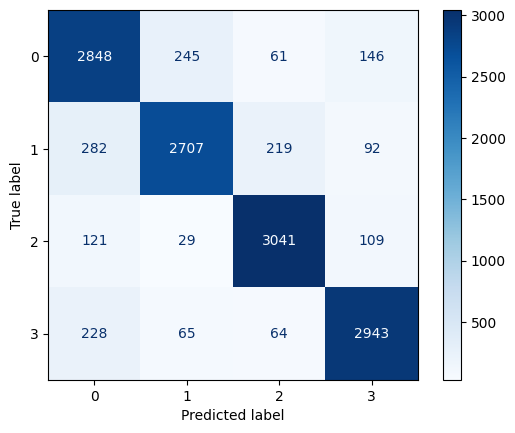

In [ ]:


def mlp_pipeline(X, Y):

    # Crear el modelo base MLP
    mlp = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(10,), random_state=1, max_iter=1000)
    mlp.fit(X_train, y_train)

    # Evaluación del modelo
    train_accuracy = mlp.score(X_train, y_train)
    test_accuracy = mlp.score(X_test, y_test)
    print(f'Training Accuracy: {train_accuracy:.2f}')
    print(f'Testing Accuracy: {test_accuracy:.2f}')

    # Matriz de confusión para datos de prueba
    y_pred = mlp.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:\n", cm)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(Y))
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

    # Reporte de clasificación para datos de prueba
    print("Classification Report para datos de prueba:\n", classification_report(y_test, y_pred))

    # Predicción para datos originales
    y_train_pred = mlp.predict(X)
    print("Classification Report para datos originales:\n", classification_report(Y, y_train_pred))

    # Búsqueda de los mejores hiperparámetros con Grid Search
    param_grid = {'hidden_layer_sizes': np.arange(2, 20)}
    mlp_grid = MLPClassifier(alpha=1e-5, random_state=1, max_iter=2000)
    mlp_cv = GridSearchCV(mlp_grid, param_grid, cv=10, n_jobs=-1, verbose=10)
    mlp_cv.fit(X, Y)
    print(f'Best Score: {mlp_cv.best_score_:.4f}, Best Params: {mlp_cv.best_params_}')

    # Validación cruzada usando KFold
    strtfdKFold = StratifiedKFold(n_splits=10)
    kfold = strtfdKFold.split(X, Y)
    scores = []
    predicted_y = np.array([])
    real_y = np.array([])

    print(f'Usando el mejor parámetro encontrado: {mlp_cv.best_params_["hidden_layer_sizes"]}')

    for train_index, test_index in kfold:
        mlp = MLPClassifier(hidden_layer_sizes=mlp_cv.best_params_['hidden_layer_sizes'], alpha=1e-5, random_state=1, max_iter=2000)
        X_train_cv, X_test_cv = X[train_index], X[test_index]
        y_train_cv, y_test_cv = Y[train_index], Y[test_index]

        mlp.fit(X_train_cv, y_train_cv)
        scores.append(mlp.score(X_test_cv, y_test_cv))

        py = mlp.predict(X_test_cv)
        predicted_y = np.append(predicted_y, py)
        real_y = np.append(real_y, y_test_cv)

    accuracy = np.mean(scores) * 100
    print(f"Accuracy del modelo utilizando validación cruzada por KFold: {accuracy:.2f}%")

    # Matriz de confusión con validación cruzada
    cnf_matrix = confusion_matrix(real_y, predicted_y)
    disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=np.unique(Y))
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

# Llamada a la función con los datos
mlp_pipeline(X, Y)


# Comparación de los modelos usando con validación cruzada

In [ ]:
list_Classifiers = [
    KNeighborsClassifier(n_neighbors=11, metric='euclidean'),
    DecisionTreeClassifier(criterion='gini', max_depth=10, max_leaf_nodes=None, min_samples_split=3),
    MLPClassifier(hidden_layer_sizes=10, alpha=1e-5, random_state=1, max_iter=2000),
    GaussianNB(var_smoothing=0.0006579332246575676)
    #SVC(C=0.1, kernel='linear')
]

In [ ]:
from sklearn.base import clone
from sklearn.model_selection import StratifiedKFold
from statistics import mean, stdev
import itertools
def cvClassifiers(X,Y, list_Classifiers):
  strtfdKFold = StratifiedKFold(n_splits=10)
  kfold = strtfdKFold.split(X, Y)
  scores = [[] for c in list_Classifiers]
  predicted_y=[[] for c in list_Classifiers]
  real_y=[[] for c in list_Classifiers]
  for train_index, test_index in kfold:
    for i,c in enumerate(list_Classifiers):
      model = clone(c)
      X_train_cv, X_test_cv = X[train_index], X[test_index]
      y_train_cv, y_test_cv = Y[train_index], Y[test_index]
      model.fit(X_train_cv, y_train_cv)
      scores[i].append(model.score(X_test_cv,y_test_cv))
      py=model.predict(X_test_cv)
      predicted_y[i]=list(itertools.chain(predicted_y[i],py.flatten().tolist()))
      real_y[i]=list(itertools.chain(real_y[i],y_test_cv.flatten().tolist()))
  accuracy=[mean(sc)*100 for sc in scores]
  cm=[confusion_matrix(real_y[i],predicted_y[i]) for i in range(0,len(list_Classifiers))]
  return accuracy, cm

Resultados de evaluación para cada clasificador: 
 [88.93887905292921, 91.20000176166442, 87.35346915766016, 85.98366937082154]


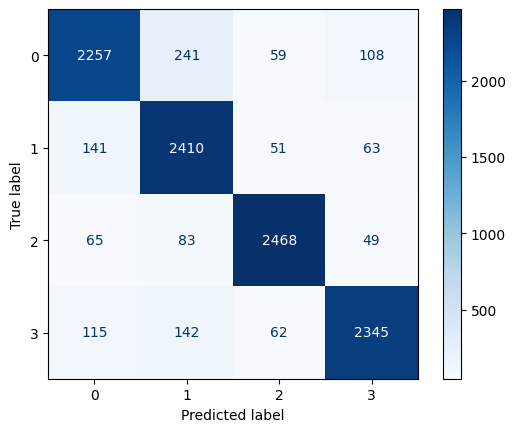

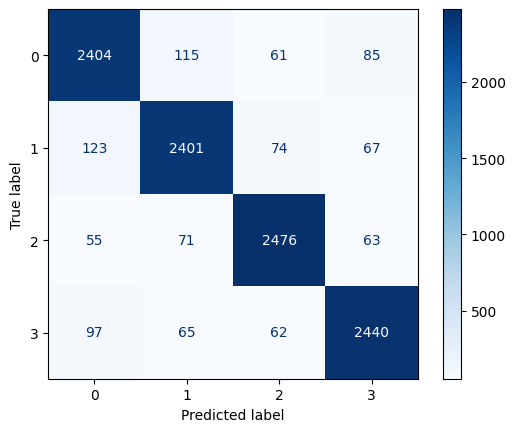

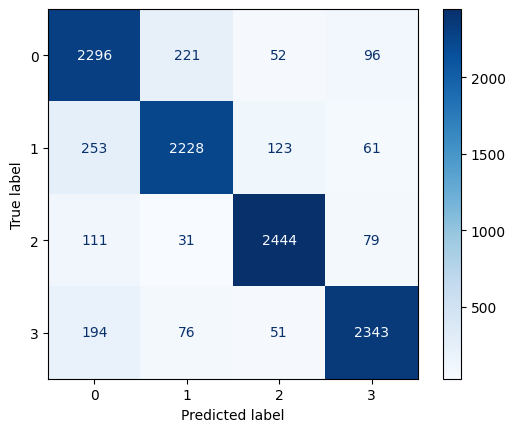

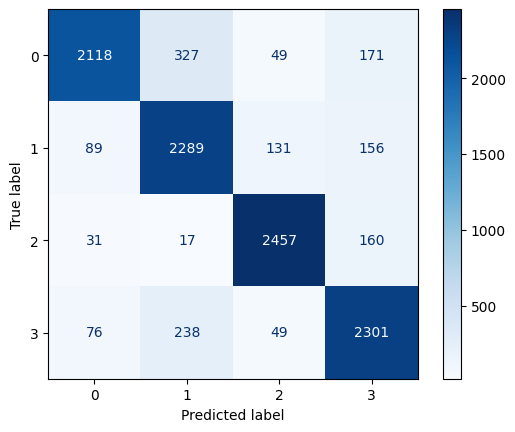

In [ ]:
a, c =cvClassifiers(X_train, y_train,list_Classifiers)

print("Resultados de evaluación para cada clasificador: \n", a)


for i in range(0,len(c)):
  disp = ConfusionMatrixDisplay(confusion_matrix=c[i], display_labels=classes)
  disp.plot(cmap=plt.cm.Blues)

# Multiclasificadores

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC


default_model = AdaBoostClassifier()
param_grid = {'n_estimators': [50, 100, 150, 200, 250, 300, 350, 400]}

In [ ]:
ada = GridSearchCV(estimator = default_model,
                          param_grid = param_grid,
                          cv = 5)
ada.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=AdaBoostClassifier(),
             param_grid={'n_estimators': [50, 100, 150, 200, 250, 300, 350,
                                          400]})

In [ ]:
validation = pd.concat([pd.DataFrame(ada.cv_results_['params']),
                        pd.DataFrame(ada.cv_results_['mean_test_score'], columns = ['Accuracy'])], axis = 1)
validation.sort_values(by="Accuracy", ascending=False)

,n_estimators,Accuracy
0,50,0.869032
2,150,0.865467
1,100,0.865185
3,200,0.865092
4,250,0.863403
5,300,0.862934
7,400,0.862183
6,350,0.862183


In [ ]:
final_ada = ada.best_estimator_

final_ada

AdaBoostClassifier()

              precision    recall  f1-score   support

           0       0.83      0.86      0.85       470
           1       0.78      0.89      0.83       470
           2       0.90      0.85      0.88       470
           3       0.94      0.85      0.89       471

    accuracy                           0.86      1881
   macro avg       0.87      0.86      0.86      1881
weighted avg       0.87      0.86      0.86      1881



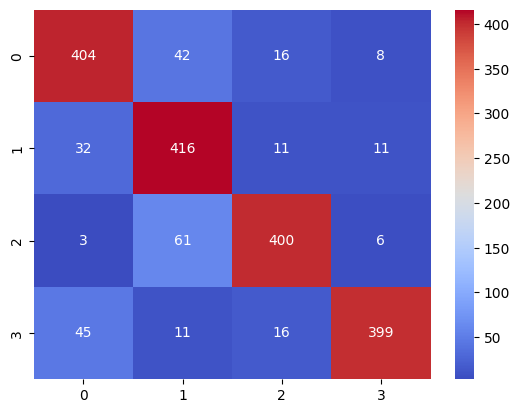

In [ ]:
#Obtener las preficciones en validacion
y_pred_test= final_ada.predict(X_test)
#Reporte de clasificacion
print(classification_report(y_test, y_pred_test))
#Matriz de confusion
sns.heatmap(confusion_matrix(y_test, y_pred_test), annot=True, cmap='coolwarm', fmt='d')
plt.show()

## Gradient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
default_model = GradientBoostingClassifier()
param_grid = {'n_estimators': [50, 100],
              'criterion': ['friedman_mse', 'squared_error'],
              'max_depth': [3, 5, 7]}

In [ ]:
gb = GridSearchCV(estimator = default_model,
                          param_grid = param_grid,
                          cv = 5)
gb.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'criterion': ['friedman_mse', 'squared_error'],
                         'max_depth': [3, 5, 7], 'n_estimators': [50, 100]})

In [ ]:
import pandas as pd
validation = pd.concat([pd.DataFrame(gb.cv_results_['params']),
                        pd.DataFrame(gb.cv_results_['mean_test_score'], columns = ['Accuracy'])], axis = 1)
validation.sort_values(by="Accuracy", ascending=False)

,criterion,max_depth,n_estimators,Accuracy
11,squared_error,7,100,0.915376
3,friedman_mse,5,100,0.914720
10,squared_error,7,50,0.914626
4,friedman_mse,7,50,0.914251
5,friedman_mse,7,100,0.913969
9,squared_error,5,100,0.913500
2,friedman_mse,5,50,0.913219
0,friedman_mse,3,50,0.913218
6,squared_error,3,50,0.913031
8,squared_error,5,50,0.912937


In [ ]:
final_gb= gb.best_estimator_
final_gb

GradientBoostingClassifier(criterion='squared_error', max_depth=7)

              precision    recall  f1-score   support

           0       0.91      0.88      0.90       470
           1       0.92      0.94      0.93       470
           2       0.93      0.95      0.94       470
           3       0.92      0.93      0.93       471

    accuracy                           0.92      1881
   macro avg       0.92      0.92      0.92      1881
weighted avg       0.92      0.92      0.92      1881



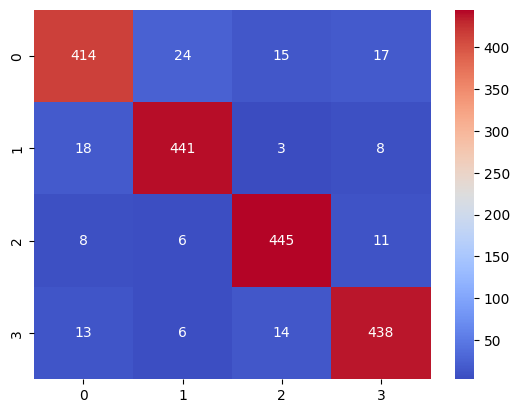

In [ ]:
#Obtener las preficciones en validacion
y_pred_test= final_gb.predict(X_test)
#Reporte de clasificacion
print(classification_report(y_test, y_pred_test))
#Matriz de confusion
sns.heatmap(confusion_matrix(y_test, y_pred_test), annot=True, cmap='coolwarm', fmt='d')
plt.show()

# Stacking

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
Training Accuracy: 0.92
Testing Accuracy: 0.91
Confusion Matrix:
 [[599  26   2  33]
 [ 41 591   3  25]
 [ 24  12 596  28]
 [ 34  11   8 607]]


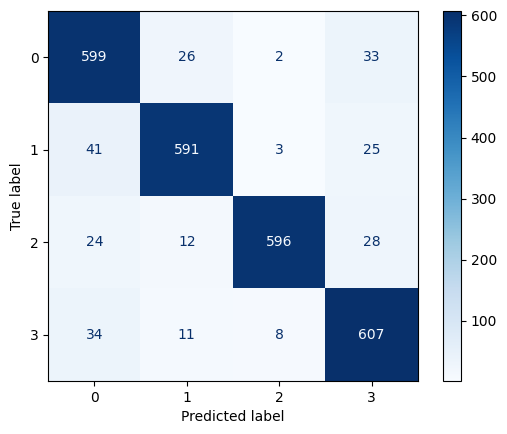

Classification Report para datos de prueba:
               precision    recall  f1-score   support

           0       0.86      0.91      0.88       660
           1       0.92      0.90      0.91       660
           2       0.98      0.90      0.94       660
           3       0.88      0.92      0.90       660

    accuracy                           0.91      2640
   macro avg       0.91      0.91      0.91      2640
weighted avg       0.91      0.91      0.91      2640

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptr

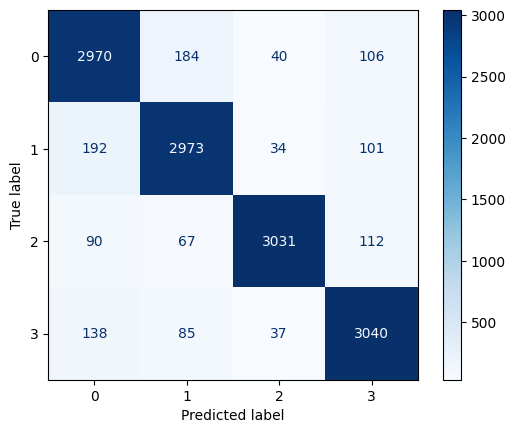

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import matplotlib.pyplot as plt

def stacking_pipeline(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42, stratify=Y)

    # Crear los modelos base para el stacking
    base_models = [
        ('knn', KNeighborsClassifier(n_neighbors=5)),
        ('nb', GaussianNB()),
        ('dt', DecisionTreeClassifier(max_depth=5))
    ]

    # Meta-modelo que usará las predicciones de los modelos base
    meta_model = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(10,), random_state=1, max_iter=1000)

    # Crear el modelo de stacking
    stacking_model = StackingClassifier(estimators=base_models, final_estimator=meta_model, cv=5, n_jobs=-1)

    # Entrenar el modelo de stacking
    stacking_model.fit(X_train, y_train)

    # Evaluación del modelo
    train_accuracy = stacking_model.score(X_train, y_train)
    test_accuracy = stacking_model.score(X_test, y_test)
    print(f'Training Accuracy: {train_accuracy:.2f}')
    print(f'Testing Accuracy: {test_accuracy:.2f}')

    # Matriz de confusión para datos de prueba
    y_pred = stacking_model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:\n", cm)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(Y))
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

    # Reporte de clasificación para datos de prueba
    print("Classification Report para datos de prueba:\n", classification_report(y_test, y_pred))

    # Validación cruzada usando StratifiedKFold
    strtfdKFold = StratifiedKFold(n_splits=10)
    kfold = strtfdKFold.split(X, Y)
    scores = []
    predicted_y = np.array([])
    real_y = np.array([])

    for train_index, test_index in kfold:
        stacking_model.fit(X[train_index], Y[train_index])
        score = stacking_model.score(X[test_index], Y[test_index])
        scores.append(score)

        # Predicciones para cada fold
        py = stacking_model.predict(X[test_index])
        predicted_y = np.append(predicted_y, py)
        real_y = np.append(real_y, Y[test_index])

    accuracy = np.mean(scores) * 100
    print(f"Accuracy del modelo utilizando validación cruzada por StratifiedKFold: {accuracy:.2f}%")

    # Matriz de confusión con validación cruzada
    cnf_matrix = confusion_matrix(real_y, predicted_y)
    disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=np.unique(Y))
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

# Llamada a la función con los datos
stacking_pipeline(X, Y)


Base Model:

Exactitud: 0.42
El rendimiento es significativamente inferior en comparación con los otros modelos, lo que lo descarta como la mejor opción.
AdaBoost:

Exactitud: 0.86
El modelo tiene un buen rendimiento, pero es inferior en comparación con Gradient Boosting y algunos otros modelos. Sin embargo, es más sencillo y rápido de entrenar.
Gradient Boosting:

Exactitud: 0.92
Este modelo muestra el mejor rendimiento en general, con altas puntuaciones de precisión, recall y f1-score en las diferentes clases. La consistencia de estos valores indica que maneja bien las clases balanceadas y no balanceadas.
SVC Lineal:

Exactitud: 0.89
El rendimiento es bueno, pero sigue siendo inferior al de Gradient Boosting. Además, este modelo tiende a ser más lento y costoso computacionalmente.
MLPClassifier (Stacking):

Exactitud: 0.91 en los datos de prueba


El modelo muestra un rendimiento competitivo, pero con un ligero ajuste adicional de los hiperparámetros (por ejemplo, aumentando max_iter), podría mejorar su convergencia.


Conclusión:


El Gradient Boosting es el mejor modelo en términos de precisión general (0.92), f1-score y manejo de las diferentes clases. Muestra un equilibrio sólido entre los valores de precision y recall, lo que indica una buena capacidad de generalización. Por lo tanto, se recomienda elegir Gradient Boosting para el modelo final.

El Stacking también es una buena opción, con una exactitud del 0.91, lo que lo hace competitivo. Si se ajustan mejor sus hiperparámetros, podría igualar o superar el rendimiento del Gradient Boosting, pero inicialmente el Gradient Boosting sigue siendo superior.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=ac687101-dce2-4150-8dd7-73d1ab742439' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>